<a href="https://colab.research.google.com/github/LaloGarces/Cryptocurrency-with-Python/blob/main/Creating_a_Cryptocurrency_with_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Creating a simple Cryptocurrency and Blockchain Transactions with Python @ [Lalo Garces](https://www.linkedin.com/in/eduardogarces1//)

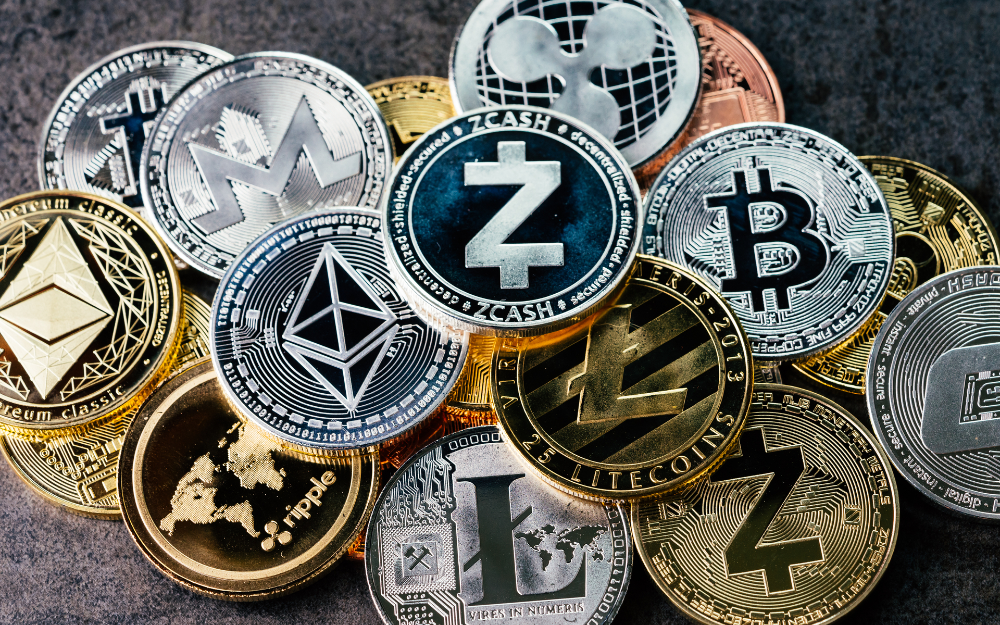

### In this mini tutorial, we're going to create a simple cryptocurrency exchange with Python. 

### The structure is going to be the same as we constructed in other colab called ["Creating a Blockchain with Python](https://github.com/LaloGarces/Blockchain-with-Python/)"

The structure is going to be divided in these sections: 

1.   Importing libraries.
2.   Creating the Cryptocurrency.
3.   Mining the Blockchain.
4.   Decentralizing the Blockchain.
5.   Running the app/development with Flask and Postman.

Credit to professor Hadelin de Ponteves to share with me part of this code and structure of the demo, being part of one of his classes as a student where I learned this project. 

# Importing the libraries

In [ ]:
#First install Flask and upodate the version
!pip install flask==0.12.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 83 kB 771 kB/s 
  Attempting uninstall: flask
    Found existing installation: Flask 1.1.4
    Uninstalling Flask-1.1.4:
      Successfully uninstalled Flask-1.1.4


In [ ]:
!pip install --upgrade Flask

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 101 kB 4.0 MB/s 
     |████████████████████████████████| 96 kB 4.8 MB/s 
     |████████████████████████████████| 133 kB 44.5 MB/s 
     |████████████████████████████████| 232 kB 35.7 MB/s 
  Attempting uninstall: MarkupSafe
    Found existing installation: MarkupSafe 2.0.1
    Uninstalling MarkupSafe-2.0.1:
      Successfully uninstalled MarkupSafe-2.0.1
  Attempting uninstall: Werkzeug
    Found existing installation: Werkzeug 1.0.1
    Uninstalling Werkzeug-1.0.1:
      Successfully uninstalled Werkzeug-1.0.1
  Attempting uninstall: Jinja2
    Found existing installation: Jinja2 2.11.3
    Uninstalling Jinja2-2.11.3:
      Successfully uninstalled Jinja2-2.11.3
  Attempting uninstall: itsdangerous
    Found existing installation: itsdangerous 1.1.0
    Uninstalling itsdangerous-1.1.0:
      Successfully uninstalled itsdangerous-1.1.0
  Attempting 

In [ ]:
#Importing Libraries

import datetime
import hashlib
import json 
from flask import Flask, jsonify, request
import requests
from uuid import uuid4
from urllib.parse import urlparse

# Creating the Cryptocurrency

In [ ]:
#Creting the Cryptocurrency

#Create a list of transactions before they're added to the block

class Blockchain:
  def __init__(self):
      self.chain = []    
      self.transactions = []                    #---> The empty list of transaction that are going to be added to the block "BEFORE"
      self.create_block(proof = 1, previous_hash = '0')  
      self.nodes = set()                        #---> Creating the nodes as a empty set / empty list (computational porpuses) 

  def create_block(self, proof, previous_hash):            
      block = {'index': len(self.chain) + 1,
               'timestamp': str(datetime.datetime.now()),  
               'proof': proof,
               'previous_hash': previous_hash,
               'transactions': self.transactions}  #---> Th Transactions added to the Block data
      self.transactions = []
      self.chain.append(block)
      return block

  def get_previous_block(self):
      return self.chain[-1]                                 

  def proof_of_work(self, previous_proof):
      new_proof = 1                                        
      check_proof = False                                   
      while check_proof is False:
          hash_operation = hashlib.sha256(str(new_proof**2 - previous_proof**2).encode()).hexdigest()
          if hash_operation[:4] == '0000':                  
            check_proof = True
          else:
              new_proof +=1
      return new_proof

  def hash(self, block):
        encoded_block = json.dumps(block, sort_keys = True).ecode()
        return hashlib.sha256(encoded_block).hexdigest()    

  def is_chain_valid(self, chain):                         
        previous_block = chain[0]
        block_index = 1                                     
        while block_index < len(chain):
            block = chain[block_index]                      
            if block['previous_hash'] != self.hash(previous_block): 
                return False
            previous_proof = previous_block['proof']
            proof = block['proof']
            hash_operation = hashlib.sha256(str(proof**2 - previous_proof**2).encode()).hexdigest()
            if hash_operation[:4] != '0000':     
                return False             
            previous_block = block
            block_index += 1
        return True

  def add_transcation(self, sender, receiver, amount):       #---> The values within the transaction
      self.transactions.append({'sender': sender,
                                'receiver': receiver,
                                'amount': amount})           #---> The dictionary with the sender, receiver & amount values
      previous_block = self.get_previous_block()             #---> Defined previously
      return previous_block['index'] + 1     

  def add_node(self, address):                               #---> Add Transaction methood. Address of the node
      parsed_url = urlparse(address)
      self.nodes.add(parsed_url.netloc)


  def replace_chain(self):                                   #---> Consensus Decentralization
      network = self.nodes
      longest_chain = None  
      max_length = len(self.chain)
      for nodes in network:
          #response = request.get('http://127.0.0.1:5000/get_chain') #--> The get_chain call. The port is going to be for each node
          # Different ports 5000 for each node. Node 1 = 5000, Node 2 = 5001, Node 3 = 5002, etc. So we use instead:
          response = requests.get('http://{node}/get_chain')
          if response.status.code == 200:                   #---> Sanity check, remember 200 code = OK.
              lenght = response.json()['lenght']            #---> The lenght of the chain
              chain = response.json()['chain']
              if lenght > max_length and self.is_chain_valid:
                max_length = lenght
                longest_chain = chain
      if longest_chain: 
          self.chain = longest_chain
          return True
      return False
  

In [ ]:
#To understand the urlparse

#from urllib.parse import urlparse

In [ ]:
#Adress of Flask
#address = 'http//127.0.0.1:5000/'    

In [ ]:
#parsed_url = urlparse(address)

In [ ]:
#parsed_url

ParseResult(scheme='', netloc='', path='http//127.0.0.1:5000/', params='', query='', fragment='')

# Null Address

In [ ]:
#Creating an address for node on port 5000
#When a miner "mine" a block is going to be rewarded with Crypo so, we need to create this address. 

node_address = str(uuid4()).replace(' - ', ' ') #--->uuid4 is going to generate a random node address, removing the "-" by nothing

# Mining the Blockchain

In [ ]:
app = Flask(__name__)
blockchain = Blockchain()

In [ ]:
@app.route('/mine_block', methods = ['GET'])   
def mine_block():
    previous_block = blockchain.get_previous_block    
    previous_proof = previous_block['Proof']          
    proof = blockchain.proof_of_work(previous_proof)
    previous_hash = blockchain.hash(previous_block)
    blockchain.add_transcation(sender = node_address, receiver = 'Lalo', amount = 7) #---> The transaction values
    block = blockchain.create_block(proof, previous_hash)
    response = {'message': 'You just have mined succesfully a block!',   
                'index': block['index'],
                'timestamp': block['timestamp'],
                'proof': block['proof'],
                'previous_hash': block['previous_hash'],
                'transactions': block['transactions']}
    return jsonify(response), 200   

# Getting the full Blockchain

In [ ]:
from werkzeug.wrappers import response
@app.route('/get_chain', methods = ['GET'])
def get_chain():
  response = {'chain': blockchain.chain,
              'length': len(blockchain.chain)}
  return jsonify(response), 200

# Verifying if the Blockchain is valid

In [ ]:
@app.route('/is_valid', methods = ['GET'])
def is_valid():
    is_valid = blockchain.is_chain_valid(blockchain.chain)
    if is_valid:
      response = {'message': 'We have a valid Blockchain'}
    else:
      response = {'message': 'The Blockchain is not valid'}
    return jsonify(response), 200

# Adding new transactions to the Blockchain

In [ ]:
@app.route('/add_transaction', methods = ['POST'])
def add_transaction():
  json =request.get_json
  transaction_keys = ['sender', 'receiver', 'amount']
  if not all (key in json for key in transaction_keys):  #---> If all the keys in the transaction key list are not in the json file return message
    return 'Not all the elements of the transaction are complete' , 400
  index = blockchain.add_transcation(json['sender'], json['receiver'], json['amount'])
  response = {'message': f'This transaction will be added to the block {index}'}
  return jsonify(response), 201 

# Making the Blockchain Decentralizaed

In [ ]:
#Connecting new nodes

@app.route('/connect_node', methods = ['POST'])
def connect_node():
    json = request.get_json()
    nodes = json.get('nodes')
    if nodes is None:
      return "No node", 400
    for node in nodes:
        blockchain.add_node(node)
    response = {'message': 'All nodes are now connected. The Altcoin Blockchain contains the following nodes:',
                'total_nodes': list(blockchain.nodes)}
    return jsonify(response), 201

In [ ]:
#Replacing the chain by the longest chain

@app.route('/is_chain', methods = ['GET'])
def replace_chain():
    is_chain_replaced = blockchain.replace_chain()
    if is_chain_replaced:
      response = {'message': 'The nodes had different chains so the chain was replaced by the longest',
                  'new_chain': blockchain.chain}
    else:
      response = {'message': 'This is the longest chain',
                  'actual_chain': blockchain.chain}
    return jsonify(response), 200

# Running the App / Demo

In [ ]:
!pip install flask-ngrok

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install pyngrok

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 745 kB 5.2 MB/s 
  Created wheel for pyngrok: filename=pyngrok-5.1.0-py3-none-any.whl size=19007 sha256=26d3f905833ae675ffa915f5d9d8687ed3f69dfb741b8c5c57281afed6eb36fd
  Stored in directory: /root/.cache/pip/wheels/bf/e6/af/ccf6598ecefecd44104069371795cb9b3afbcd16987f6ccfb3
Successfully built pyngrok


In [ ]:
#from flask import Flask
#from flask_ngrok import run_with_ngrok
#app = Flask(__name__)
#run_with_ngrok(app)   

In [ ]:
from flask import Flask
from pyngrok import ngrok

In [ ]:
ngrok.set_auth_token("2GaZDke0T8UBzJ6OMpjuLHOxEU9_68xXQ2CJwkTsK5QcfginH")

In [ ]:
port_no = 5000

In [ ]:
app = Flask(__name__)
ngrok.set_auth_token("2GaZDke0T8UBzJ6OMpjuLHOxEU9_68xXQ2CJwkTsK5QcfginH")
public_url =  ngrok.connect(port_no).public_url

In [ ]:
app.run(port=port_no)

 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit


In [ ]:
#app.run(host='0.0.0.0', port=5000)

## Important comments: 

Sometimes Flask doesn't run in Colab, if you present a problem, I recommend you to run the code in Spyder from Anaconda ecosystem https://www.spyder-ide.org/

To interact in the demo, we need 2 json files:

1.   **Nodes json file** --> Working with conect_node (connecting the nodes).
2.   **Transactions json file** --> Working with add_transaction (to send "crypto" to specific node of the chain).

I'm going to include them here to copy and paste them in the Postman "POST" section of each node (each port 5000, 5001, 5002; I explain you this in more details).

------

*   **Nodes**

#### {
####    "nodes": ["http://127.0.0.1:5001",
####              "http://127.0.0.1:5002",
####              "http://127.0.0.1:5003"]
#### }

*   **Transactions**

#### {
####    "sender": "",
####    "receiver": "",
####    "amount": 
#### }

In "sender" and "receiver" you can use your name and the name of your friends for the demo purposes but in real life, this data contains the "private keys".

------

## Important to mention

To represent each node of the chain, we're going to connect 3 different computers running 3 different codes separately. The code is going to be the same, only the part that changes is the port where we're going to run the code: 


* Computer 1: Port 5000
* Computer 2: Port 5001
* Computer 3: Port 5002


-------

* Computer 1: app.run(host='0.0.0.0', port= 5000)
* Computer 2: app.run(host='0.0.0.0', port= 5001)
* Computer 3: app.run(host='0.0.0.0', port= 5002)


Dictionary of the requests: 


*   **get_chain** = Generate genesis block and the new blocks after mining them.
*   **conect_node** = Connect each node to the blockchain.
*   **mine_block** = Mining the block in "YOUR" node, each node need to mine each block.
*   **replace_chain** = Let you get the entire chain with all the blocks of all the nodes. Working like a concensus. 
*   add_transaction = To send crypto to another node.






# Results

Step 1: 

Due I was presenting some errors on port 5000, only for the demos I changed to ports 500, 501 & 502

Create the genesis block with the port 5000 and the GET: get_chain:

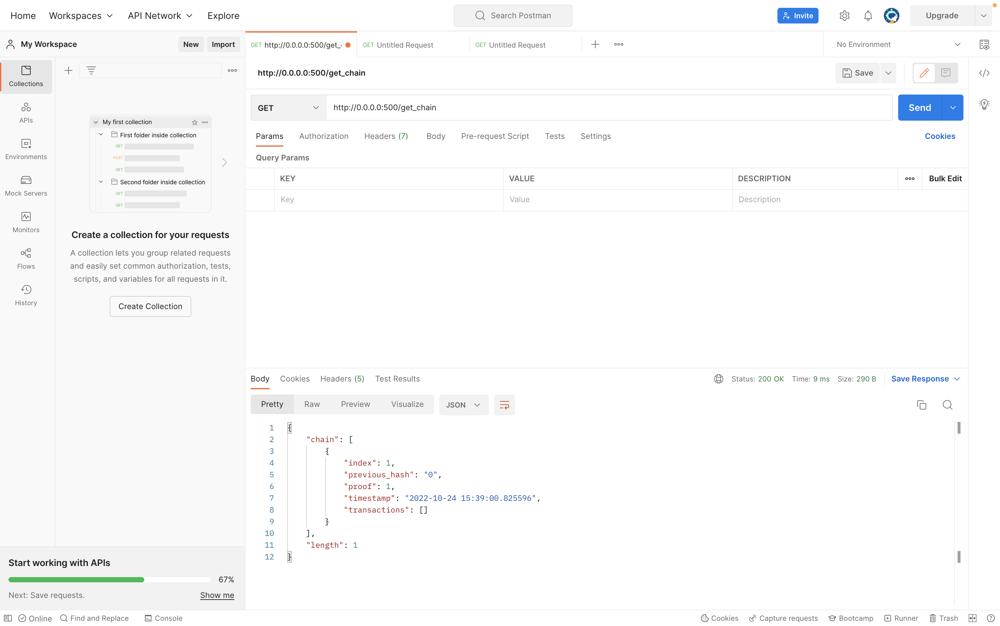

Step 2: Create genesis Block with port 501 for the second computer/node:

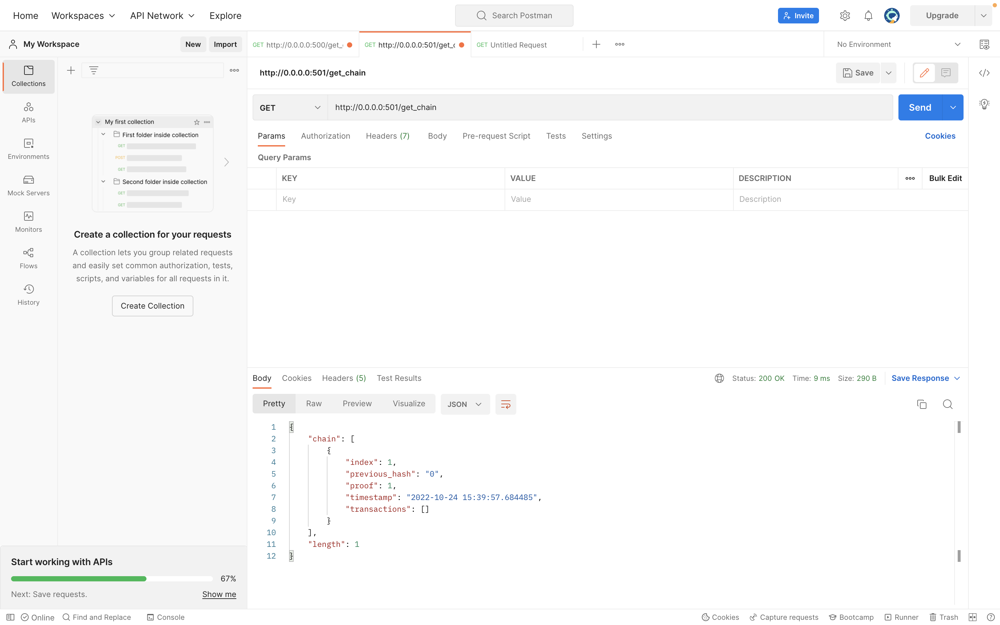


Step 3: Create genesis Block with port 502 for the third computer/node:

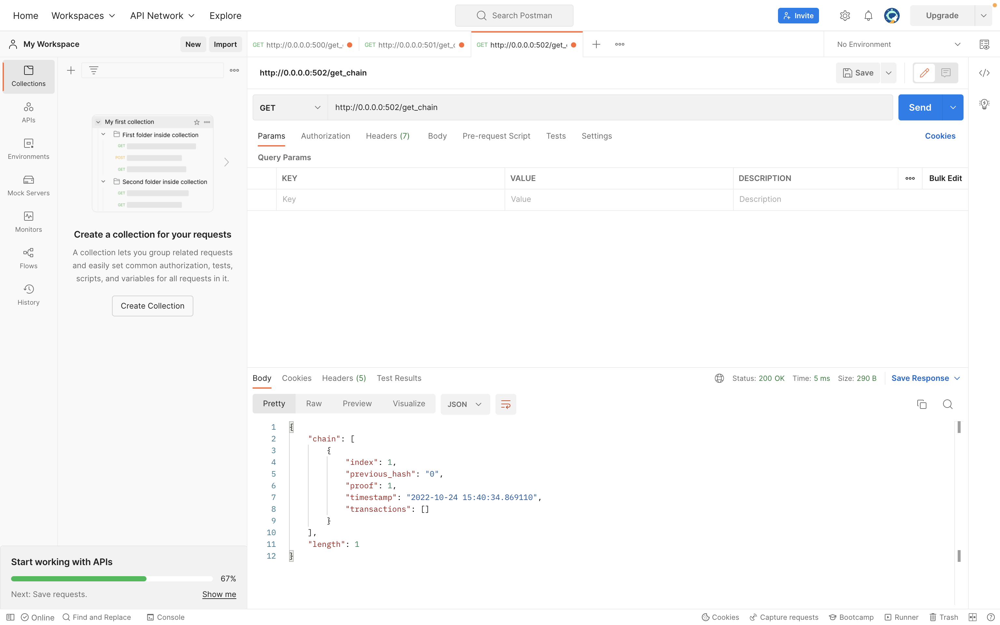

Step 4: Connect the nodes with the json file of "Nodes" & the conect_node.

Within postman please follow the next route: POST > Body > Raw > JSON.

Like we're connecting the nodes from node 1, we only in the JSON file use node 2 and node 3:

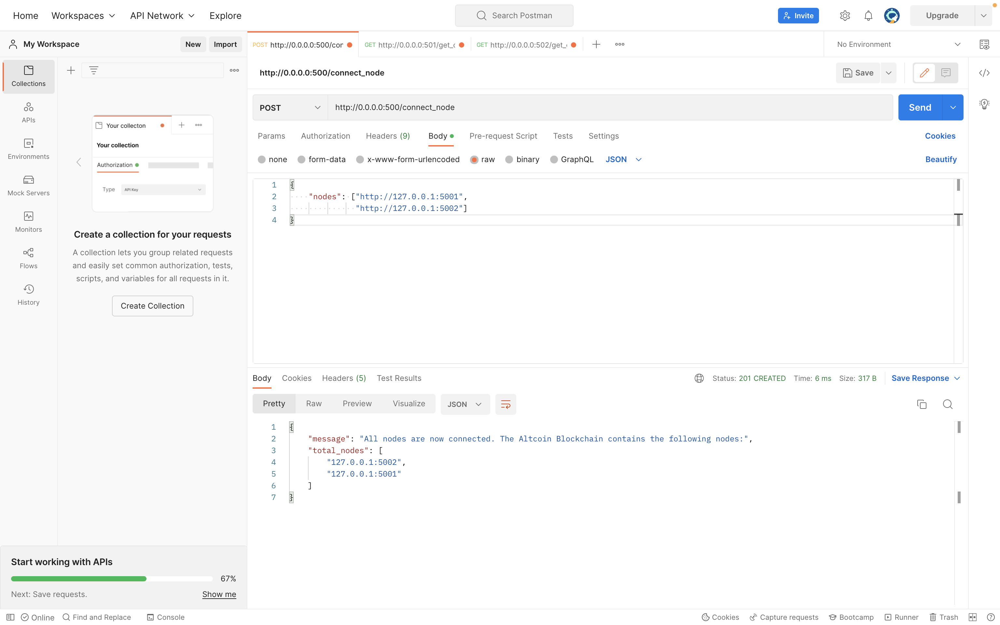

Step 5: Do the previous step to connect node 2:

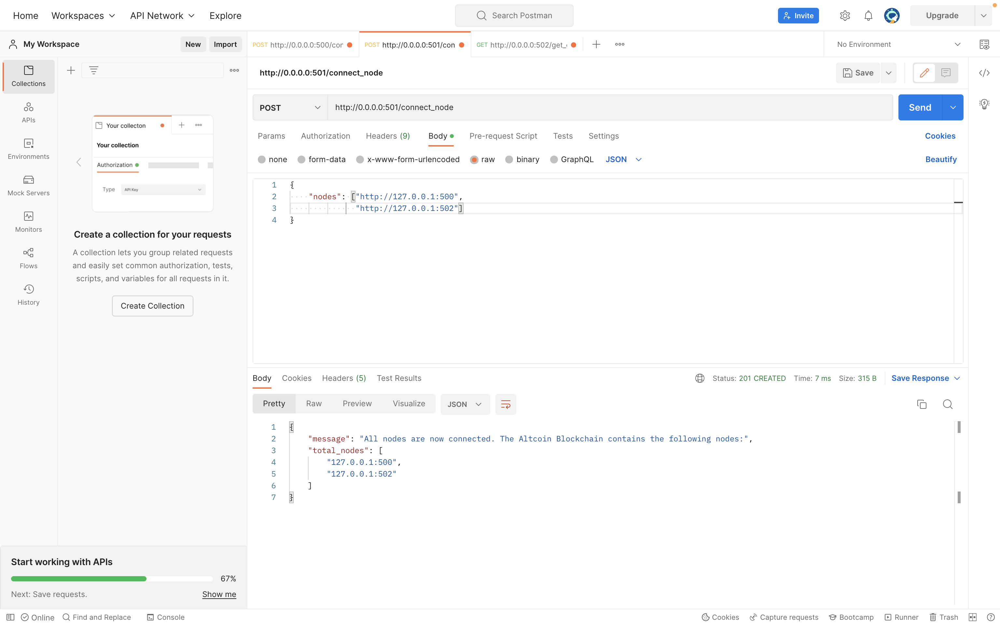

Step 6: Do the previous step to connect node 3:

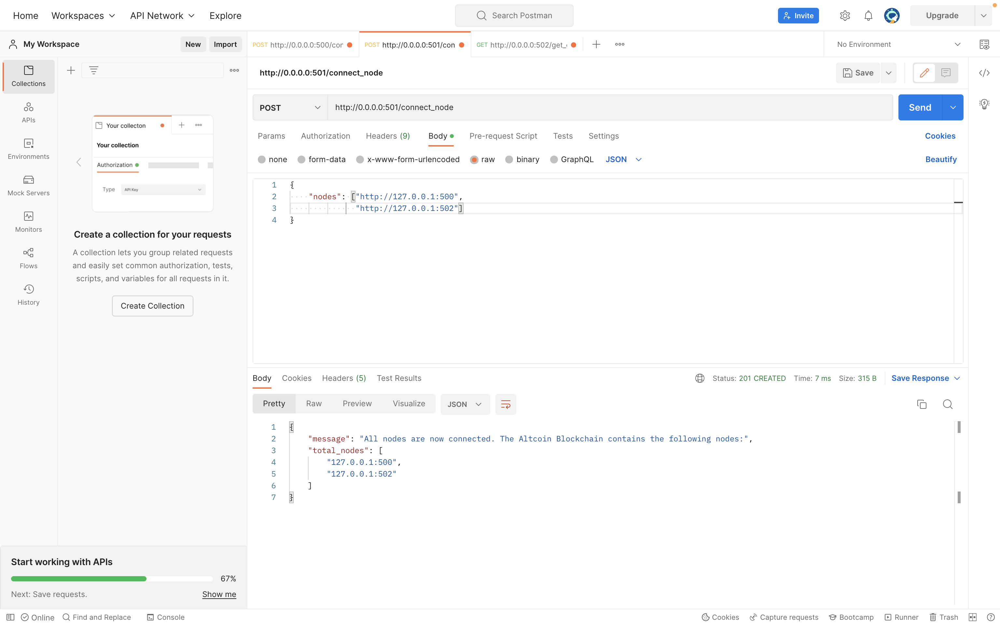

Step 7: In node 1 mine the block with mine_block. Notice that the amount sent was 1 Altcoin:

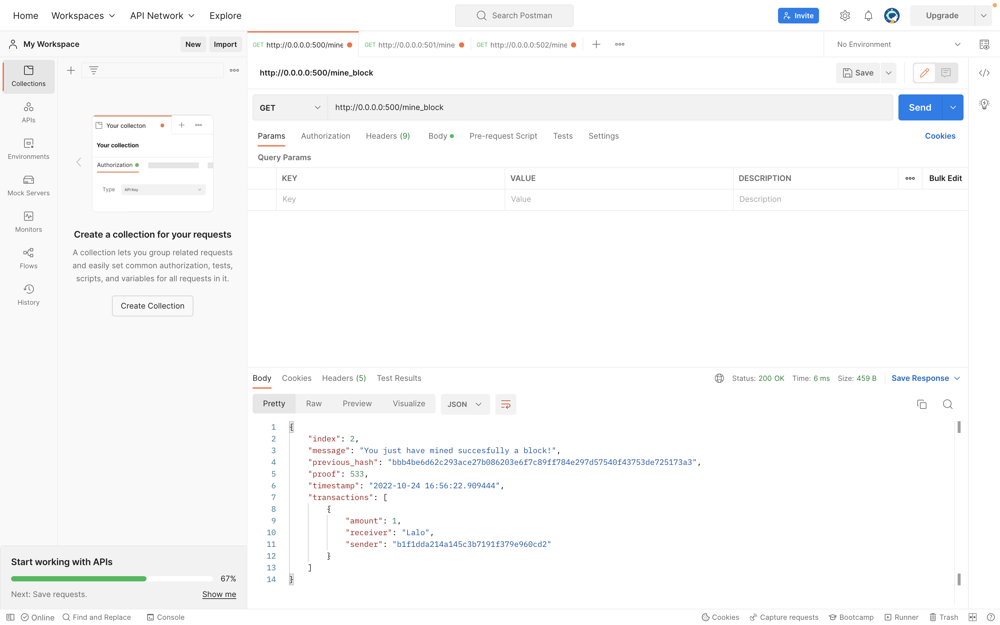

Step 8: In node 1, use the get_chain to se all the current blocks you have in your chain: 

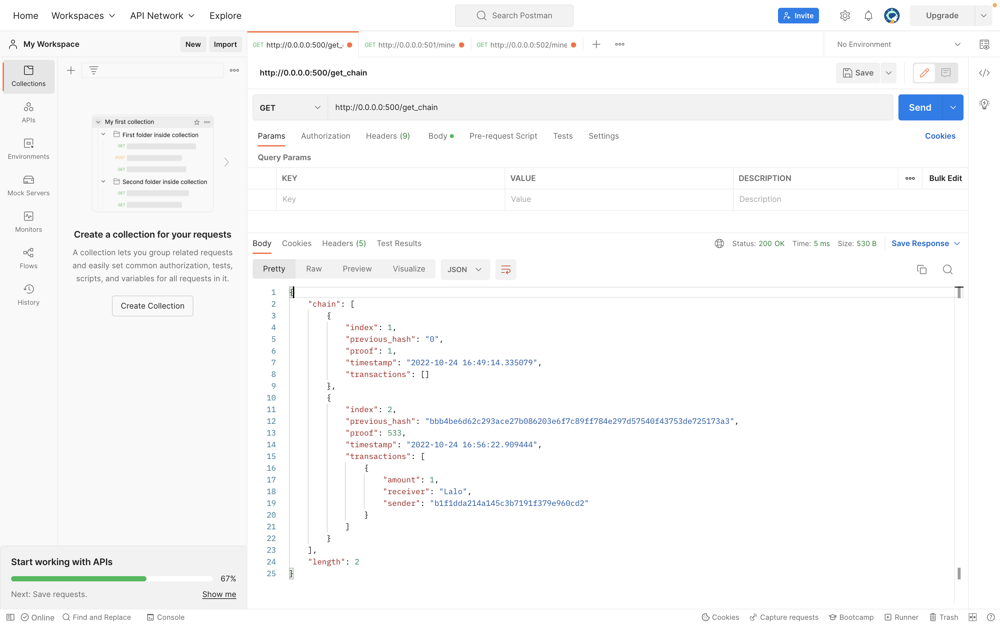

Step 9: But, if we ask to our nodes to verify their current chain, they're not going to have the largest chain, only in their chain, they're going to have the genesis block:

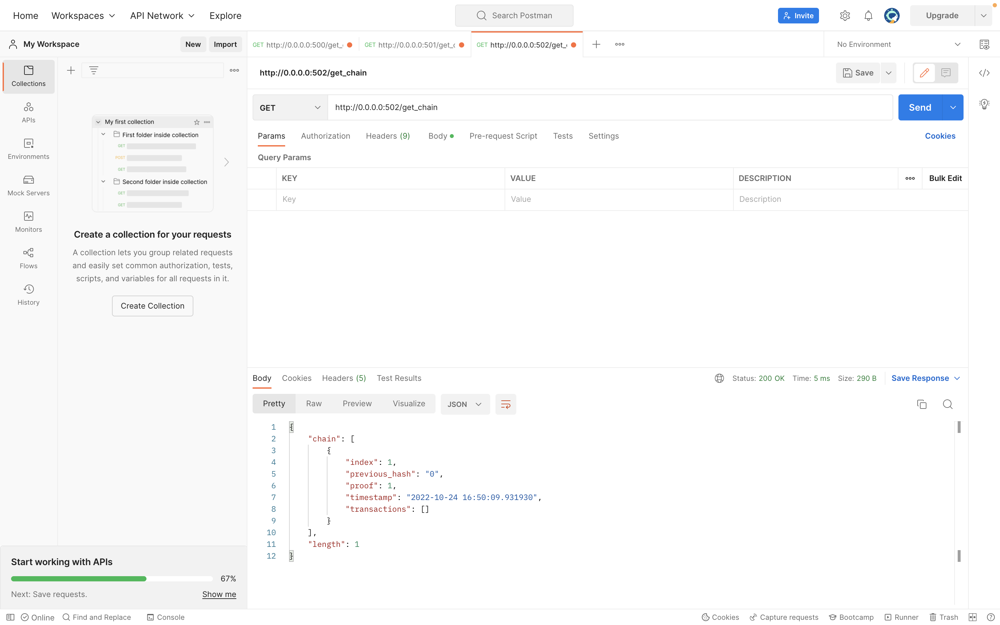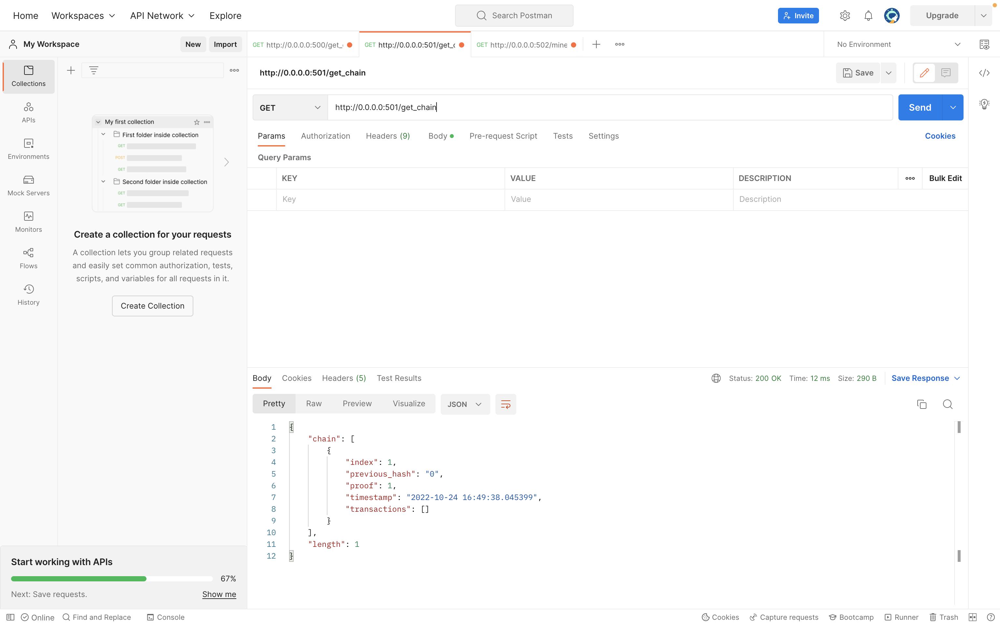

Step 10: Asking to each node use the replace_chain, is going to let us add the new blocks to each of the nodes: 

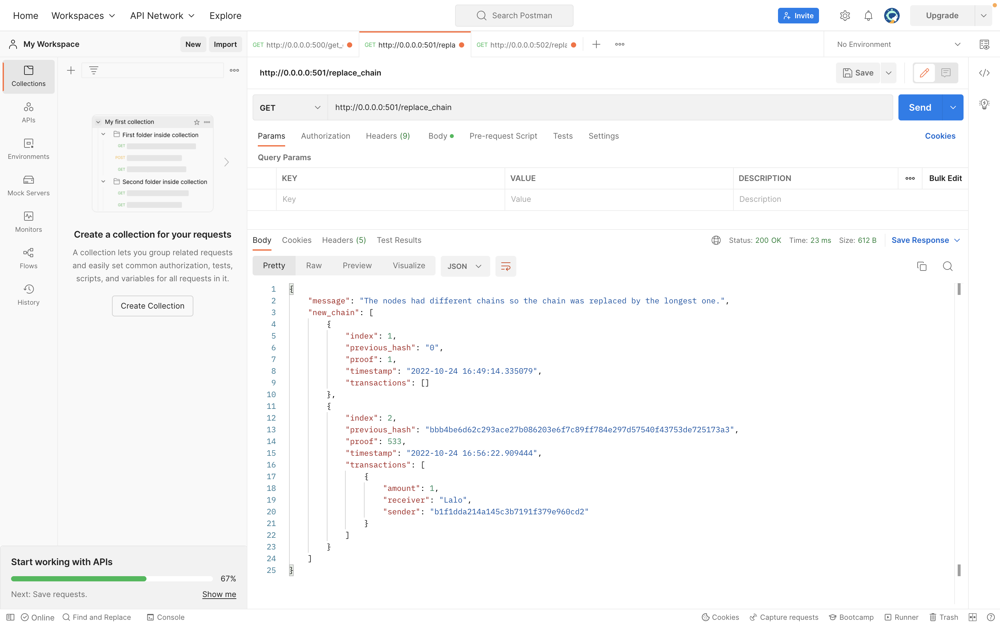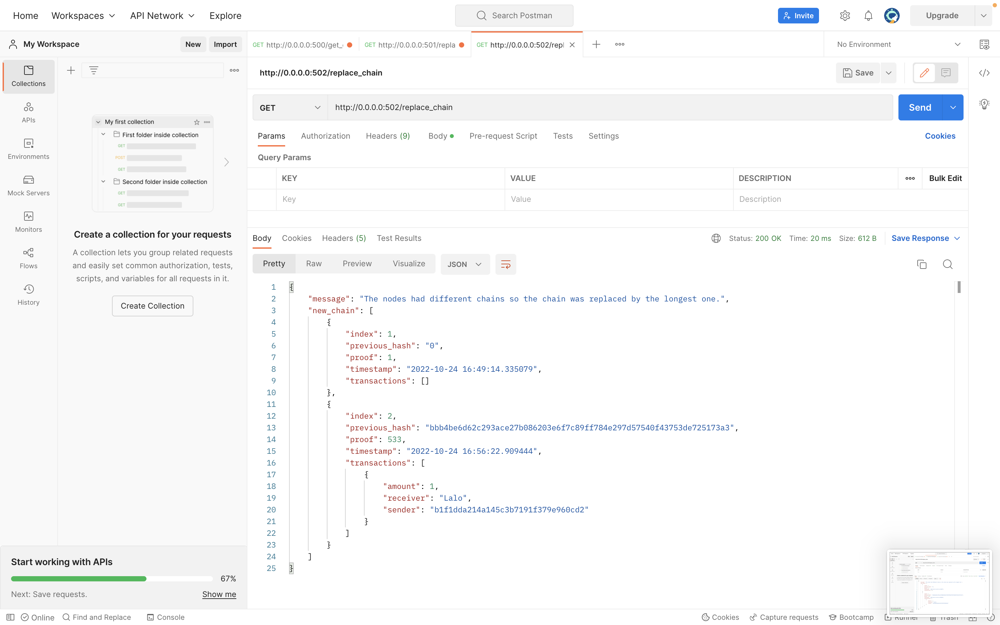

Step 11: Transaction! We're going to send Altcoins to one of the other nodes of the chain. 

Within postman please follow the next route: POST > Body > Raw > JSON.

Use de Json file for Transactions and the add_transaction:

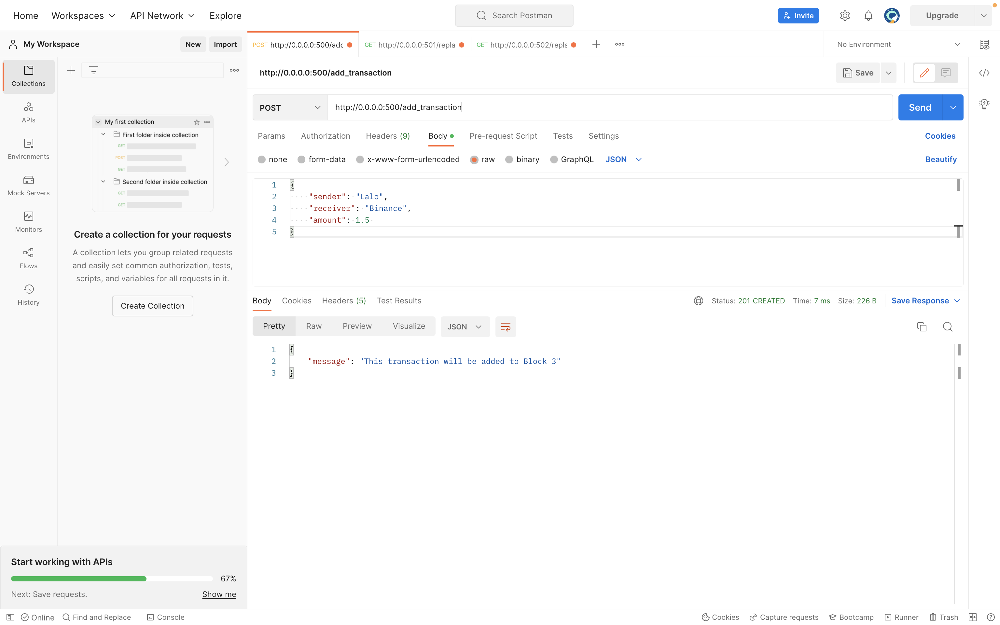

Step 12: The transaction is not part of the Blockchain due haven't been mined, so, we need to mine this block to be added to the chain. Notice how the chain in node 1, has the 2 transactions done:

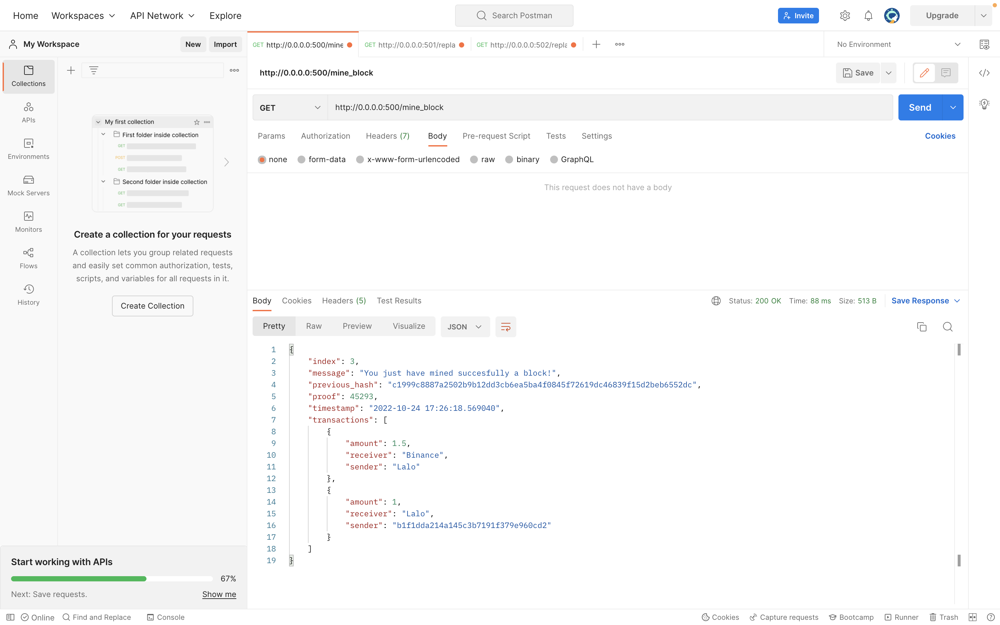

Step 13: Verify all the blocks in the chain of node 1 (Result: 3 Blocks):

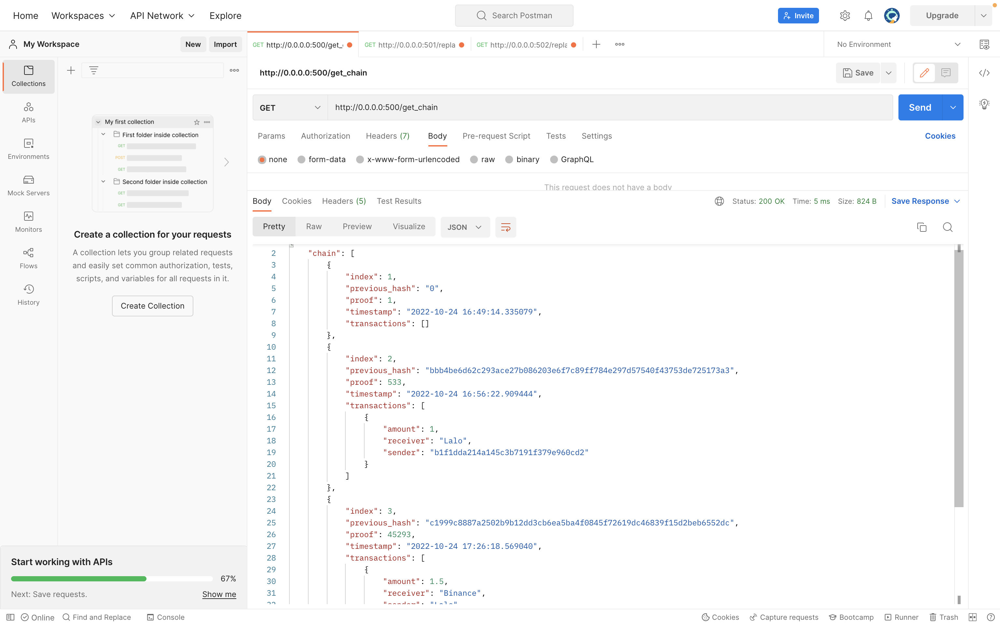

In [ ]:
{
    "chain": [
        {
            "index": 1,
            "previous_hash": "0",
            "proof": 1,
            "timestamp": "2022-10-24 16:49:14.335079",
            "transactions": []
        },
        {
            "index": 2,
            "previous_hash": "bbb4be6d62c293ace27b086203e6f7c89ff784e297d57540f43753de725173a3",
            "proof": 533,
            "timestamp": "2022-10-24 16:56:22.909444",
            "transactions": [
                {
                    "amount": 1,
                    "receiver": "Lalo",
                    "sender": "b1f1dda214a145c3b7191f379e960cd2"
                }
            ]
        },
        {
            "index": 3,
            "previous_hash": "c1999c8887a2502b9b12dd3cb6ea5ba4f0845f72619dc46839f15d2beb6552dc",
            "proof": 45293,
            "timestamp": "2022-10-24 17:26:18.569040",
            "transactions": [
                {
                    "amount": 1.5,
                    "receiver": "Binance",
                    "sender": "Lalo"
                },
                {
                    "amount": 1,
                    "receiver": "Lalo",
                    "sender": "b1f1dda214a145c3b7191f379e960cd2"
                }
            ]
        }
    ],
    "length": 3
}

Step 14: But if we see node 2 and node 3, they only have 2 blocks in their chain, so, remember apply the concensus:

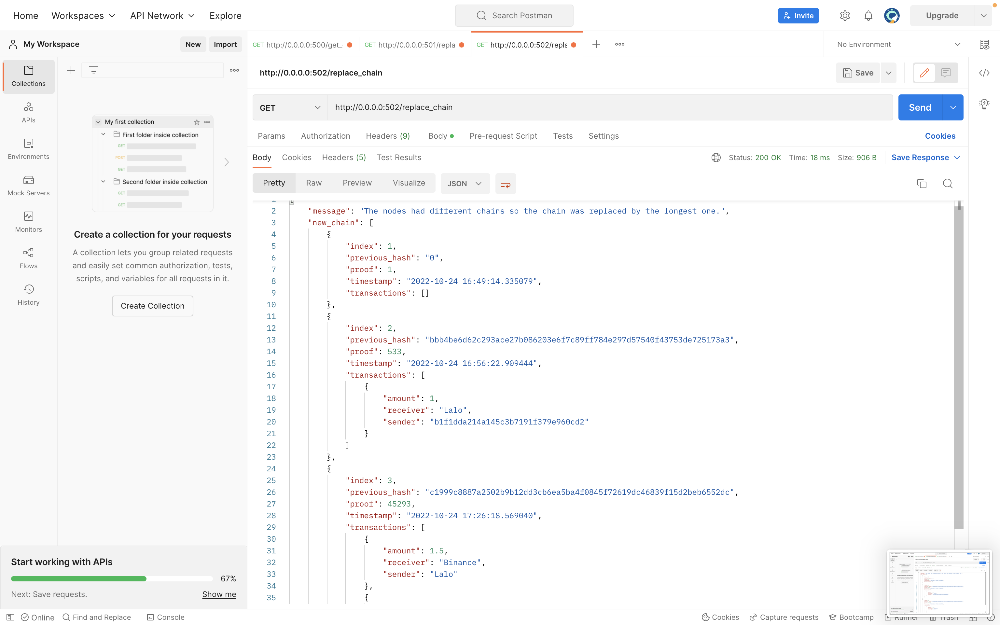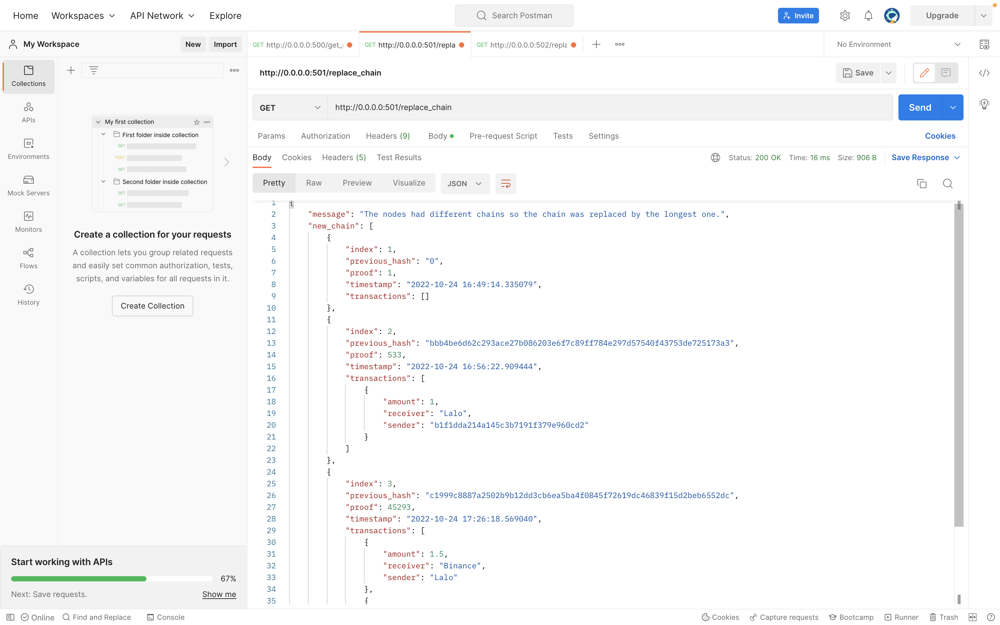

And that's it! We have a fully connected Blockchain with 3 nodes receiving and sending Cryptocurrency!

Hope this demo help you! 😊